To Do:
1. Scratch the resonator mode. Sweep just qubit mode.
    - do flux sweep
    - do frequency sweep
    - perform branch analysis based on the results
2. Branch analysis at target flux point -- composite system results
3. Compare branch analysis results to Sherbrooke
4. Switch to another qubit (qC) -- do drive sweep, branch analysis, flux sweep
5. vary the qubit params of qA (error margins)
6. Quantitative answer to the dimensionality problem (how much are we populating qubit and resonator subsystems)
7. add qubit-induced nonlinearities to resonator frequency (Boissonnealt 2010)

Higher order problems:
- adding single mode leakage channels incrementally + compare to data!
- adapt to open quantum systems (Floquet with Linblad)

In [2]:
import floquet as ft
from floquet.model import CompositeModel
import numpy as np
import qutip as qt
import matplotlib.pyplot as plt
import scqubits as scq
from cycler import cycler
from itertools import islice

## Single Qubit Mode (qA)
leaving it for reference

### Flux Sweep 

In [ ]:

color_cycler = cycler(plt.rcParams["axes.prop_cycle"])
ls_cycler = cycler(ls=["-", "--", "-.", ":"])
alpha_cycler = cycler(alpha=[1.0, 0.6, 0.2])
color_ls_alpha_cycler = alpha_cycler * ls_cycler * color_cycler

filepath = ft.generate_file_path("h5py", "fluxonium_floquet", "out")

num_states = 20 
base_qubit_params = {"EJ": 4.167, "EC": 0.8308, "EL": 1.203, "flux": 0.5, "cutoff": 110}
state_indices = [0, 1]
plot_state_idx = 0
plot_state_idx1  = 1

flux_vals = np.linspace(0, 0.51, 200)   # define flux sweep
chi_ac_vals = 2*np.pi*np.linspace(0.00, 0.2, 200)  #number of amplitudes + desired stark shift range

omega_d_fix = 2*np.pi*5.095  #fixed drive frequency

omega_d_band = np.linspace(5.08-5e-3, 5.08+5e-3, 5)*2*np.pi  #include linewidth range +/- 5MHz, following Sai


#important!!
options = ft.Options(
    num_cpus=6, #parallelization over drive frequency
    fit_range_fraction=0.5, #first chunk[0-50%]: compare Floquet w/ bare // second chunk [50-100%]: compare to "ideal displaced"
    floquet_sampling_time_fraction=0.0,
    nsteps=10000, #for qtip's ODE solver; integrates SE over one period (default: 30,000)
    fit_cutoff=4, #include terms up to fourth order for the polynomial fit in floquet
    overlap_cutoff=0.5, #overlap between a Floquet state + reference state < 0.8, then resonance or avoided crossing
    save_floquet_modes=False
)

#i think right now the dimension is: (# frequencies = 1 for fixed case) x (# amplitudes) x (num states) x (hilbert dim)
#depending how long sim takes, can modify these params


# define our hilbert space  for given flux value!!
def get_H0_H1_for_flux(flux_value: float) -> tuple[qt.Qobj, qt.Qobj]:
    qparams = dict(base_qubit_params)
    qparams["flux"] = float(flux_value)
    fluxonium = scq.Fluxonium(**qparams, truncated_dim=num_states) 
    hilbert_space = scq.HilbertSpace([fluxonium])
    hilbert_space.generate_lookup()
    
    #diagonal drift Hamiltonian
    evals = hilbert_space["evals"][0][0:num_states]
    H0 = 2 * np.pi * qt.Qobj(np.diag(evals - evals[0]))
    
    #for the classical drive; define as charge operator in dressed basis
    H1 = hilbert_space.op_in_dressed_eigenbasis(fluxonium.n_operator)
    return H0, H1

#some helper functions
def run_floquet(H0, H1, omega_d_array, chi_array):
    chi_to_amp = ft.ChiacToAmp(H0, H1, state_indices, omega_d_array)
    drive_amps = chi_to_amp.amplitudes_for_omega_d(chi_array)
    model = ft.Model(H0, H1, omega_d_values=omega_d_array, drive_amplitudes=drive_amps)
    fa = ft.FloquetAnalysis(model, state_indices=state_indices, options=options)
    return fa.run(filepath=None)

def plot_map(arrays, title):
    fig, ax = plt.subplots(figsize=(7.6, 3.6))
    im = ax.imshow(
        arrays.T, origin="lower", cmap="Blues", aspect="auto",
        extent=[flux_vals.min(), flux_vals.max(),
                chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)]
    )
    ax.set_xlabel("flux")
    ax.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"$1 - |\langle \rm disp|\rm Floquet\rangle|^2$")
    plt.tight_layout(); plt.show()



Running floquet simulation with parameters: 
model: H0: Quantum object: dims=[[20], [20]], shape=(20, 20), type='oper', dtype=Dense, isherm=True
Qobj data =
[[  0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.          33.10309971   0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.           0.          61.02400389   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.           0.           0.          82.50598052   0.
    0.           0.           0.           0.    

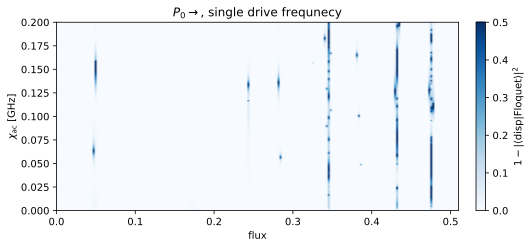

In [46]:
scar_single = np.zeros((len(flux_vals), len(chi_ac_vals)))
for i, flx in enumerate(flux_vals):
    H0, H1 = get_H0_H1_for_flux(flx)
    data = run_floquet(H0, H1, omega_d_array=np.array([omega_d_fix]), chi_array=chi_ac_vals)
    #data['displaced_state_overlaps'] has shape (num of drive freq, number of chi vals, number of states tracked (0,1))
    ovlp = data["displaced_state_overlaps"][:, :, plot_state_idx]  #select the branch you want, shape (1, chi) for fixed omega_d
    scar_single[i, :] = np.clip(1.0 - np.abs(ovlp[0, :])**2, 0, 0.5) #get the overlap!!
plot_map(scar_single, r"$P_0 \rightarrow$, single drive frequnecy")

In [ ]:
max_curves = 13
data_slice = np.abs(data["avg_excitation"][om, :, :max_curves])

fig, ax = plt.subplots(figsize=(6, 3.5))
from itertools import islice
for curve_idx, (y, sty) in enumerate(
    zip(data_slice.T, islice(color_ls_alpha_cycler, data_slice.shape[1])), 
    start=0
):
    ax.plot(chi_ac_values/(2*np.pi), y, label=str(curve_idx), **sty)

ax.set_ylabel(r"$N_{t}$")
ax.set_xlabel("induced ac Stark shift [GHz]")
ax.legend(fontsize=12, ncol=2, loc="upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.savefig("branch_a.png", dpi=200)


max_curves = 11
idxs = range(min(max_curves, floquet_analysis.hilbert_dim))

In [55]:
scar_single1 = np.zeros((len(flux_vals), len(chi_ac_vals)))

for i, flx in enumerate(flux_vals):
    H0, H1 = get_H0_H1_for_flux(flx)
    data = run_floquet(H0, H1, omega_d_array=np.array([omega_d_fix]), chi_array=chi_ac_vals)
    #data['displaced_state_overlaps'] has shape (num of drive freq, number of chi vals, number of states tracked (0,1))
    ovlp = data["displaced_state_overlaps"][:, :, plot_state_idx1]  #select the branch you want, shape (1, chi) for fixed omega_d
    scar_single1[i, :] = np.clip(1.0 - np.abs(ovlp[0, :])**2, 0, 0.5) #get the overlap!!

Running floquet simulation with parameters: 
model: H0: Quantum object: dims=[[20], [20]], shape=(20, 20), type='oper', dtype=Dense, isherm=True
Qobj data =
[[  0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.          33.10309971   0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.           0.          61.02400389   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.           0.           0.          82.50598052   0.
    0.           0.           0.           0.    

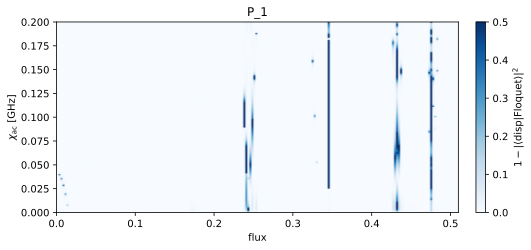

In [56]:
plot_map(scar_single1, "P_1")

## Single Qubit Mode (Optimized)

#### Initialize the qubit + set floquet sim options

In [5]:
color_cycler = cycler(plt.rcParams["axes.prop_cycle"])
ls_cycler = cycler(ls=["-", "--", "-.", ":"])
alpha_cycler = cycler(alpha=[1.0, 0.6, 0.2])
color_ls_alpha_cycler = alpha_cycler * ls_cycler * color_cycler

dim_q = 20
state_indices = [0,1]
omega_d_idx_df = 0 #if using freq. axis

flux_vals = np.linspace(0, 0.51, 100) 
chi_ac_vals = 2*np.pi* np.linspace(0, 0.2, 200) #[rads/s]

omega_d_single_A = 2*np.pi*5.095
omega_d_single_C = 2*np.pi*7.327

#narrow band over drive frequencies:
omega_d_band_A = 2*np.pi*np.linspace(5.08-5e-3, 5.08+5e-3, 5)
omega_d_band_C = 2*np.pi*np.linspace(7.327-5e-3, 7.327+5e-3, 5)

#floquet sim options
options = ft.Options(
    num_cpus=6,
    fit_range_fraction=0.5,
    floquet_sampling_time_fraction=0.0,
    nsteps=10000,
    fit_cutoff=4,
    overlap_cutoff=0.5,
    save_floquet_modes=False,
)
#class for initializing qubits
class makequbit:
    def __init__(self, name, EJ, EC, EL, flux=0.5, cutoff=110, 
                 omega_d_array=None, use_band=False):
        self.name = name
        self.params = dict(EJ=EJ, EC=EC, EL=EL, flux=flux, cutoff=cutoff)
        self.omega_d_array = np.atleast_1d(omega_d_array)
        self.use_band = bool(use_band)
    
qA = makequbit(
    name = 'A',
    EJ=4.167, EC=0.8308, EL=1.203, flux=0.5, cutoff=110,
    omega_d_array= np.array([omega_d_single_A]),
    use_band=False
    
)

qC = makequbit(
    name="C",
    EJ=3.6996, EC=0.8394, EL=1.0376, flux=0.5, cutoff=110,
    omega_d_array=np.array([omega_d_single_C]),  # single fixed freq
    use_band=False
)

#### Building hamiltonian

In [3]:
def get_H0_H1_for_flux(flux_value: float, qubit_params: dict, dim_q: int):
    """construct the drift and drive hamiltonians for a set flux value"""

    qparams = dict(qubit_params)
    qparams['flux'] = float(flux_value)
    fluxonium = scq.Fluxonium(**qparams, truncated_dim=dim_q)
    hilbert_space = scq.HilbertSpace([fluxonium])
    hilbert_space.generate_lookup()

    #for diagonal drift H -- set first eig.val (ground) to 0 (just setting a baseline)
    evals = hilbert_space['evals'][0][:dim_q]
    H0 = 2*np.pi*qt.Qobj(np.diag(evals - evals[0]))

    #define drive operator in dressed basis
    H1 = hilbert_space.op_in_dressed_eigenbasis(fluxonium.n_operator)

    return H0, H1

#### Run Floquet + Plot (Flux Sweep)

In [6]:
def run_floquet(H0, H1, omega_d_array, chi_array, state_indices):
    chi_to_amp = ft.ChiacToAmp(H0, H1, state_indices, omega_d_array)
    drive_amps = chi_to_amp.amplitudes_for_omega_d(chi_array)
    model = ft.Model(H0, H1, omega_d_values=omega_d_array, drive_amplitudes=drive_amps)
    return ft.FloquetAnalysis(model, state_indices=state_indices, options=options).run(filepath=None)

#fixed drive freq.
def flux_scar_map(qubit, plot_state_idx: int, flux_grid, chi_grid,
    *,
    omega_d_single, 
    dim_q: int = dim_q,
    state_indices_list = state_indices,
):
    """
   (flux, chi_ac) of 1 - |overlap|^2 for a tracked state , using the 'displaced_state_overlaps'
    """
    # choose drive frequency

    omega_arr = np.array([omega_d_single], dtype=float)

    scar = np.zeros((len(flux_grid), len(chi_grid)), dtype=float)


    for i, flx in enumerate(flux_grid):
        H0, H1 = get_H0_H1_for_flux(flx, qubit.params, dim_q)
        data = run_floquet(
            H0, H1, omega_d_array=omega_arr, chi_array=chi_grid, state_indices=state_indices_list
        )

        ovlp = np.asarray(data['displaced_state_overlaps'])  


        if plot_state_idx >= ovlp.shape[2]:
            raise IndexError(f"plot_state_idx={plot_state_idx} not compatible w/ the set number of tracked states {ovlp.shape[2]}")
        col = ovlp[0, :, plot_state_idx]  
        scar[i, :] = np.clip(1.0 - np.abs(col) ** 2, 0.0, 0.5)
    return scar, flux_grid, chi_grid


def plot_flux_scar_map(
    scar_matrix,
    flux_grid,
    chi_grid,
    *,
    title: str = r"$1-|\langle \mathrm{disp}|\mathrm{Floquet}\rangle|^2$",
    vmin: float | None = None,
    vmax: float | None = None,
):
    fig, ax = plt.subplots(figsize=(7.6, 3.6))
    im = ax.imshow(
        scar_matrix.T,
        origin="lower",
        cmap="Blues",
        aspect="auto",
        extent=[flux_grid.min(), flux_grid.max(),
                chi_grid.min()/(2*np.pi), chi_grid.max()/(2*np.pi)],
        vmin=vmin, vmax=vmax,
        interpolation="none",
    )
    ax.set_xlabel("flux")
    ax.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"$1-|\langle \mathrm{disp}|\mathrm{Floquet}\rangle|^2$")
    plt.tight_layout()
    plt.show()


def run_and_plot_flux_scar_for_states(
    qubit_cfg,
    flux_grid=flux_vals,
    chi_grid=chi_ac_vals,
    state_idxs=(0, 1),
    *,
    omega_d_single: float | None = None,
    dim_q: int = dim_q,
    state_indices_list = state_indices,
):
    """
    plots a map for each requested state index.
    """
    for sidx in state_idxs:
        scar, F, C = flux_scar_map(
            qubit_cfg,
            plot_state_idx=sidx,
            flux_grid=flux_grid,
            chi_grid=chi_grid,
            omega_d_single=omega_d_single,
            dim_q=dim_q,
            state_indices_list=state_indices_list,
        )
        title = fr"{qubit_cfg.name}: $P_{{{sidx}}}\rightarrow$ (single $\omega_d/2\pi$ = {omega_d_single/(2*np.pi):.3f} GHz)"
        plot_flux_scar_map(scar, F, C, title=title)


In [ ]:
run_and_plot_flux_scar_for_states(qA, flux_vals, chi_ac_vals, state_idxs=[0,1],
                                  omega_d_single=omega_d_single_A)

Running floquet simulation with parameters: 
model: H0: Quantum object: dims=[[20], [20]], shape=(20, 20), type='oper', dtype=Dense, isherm=True
Qobj data =
[[  0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.          33.10309971   0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.           0.          61.02400389   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [  0.           0.           0.          82.50598052   0.
    0.           0.           0.           0.    

### Drive sweep

In [ ]:
def drive_sweep_floquet(
    qubit,
    fixed_flux: float,
    omega_d_values,
    chi_ac_values,
    *,
    dim_q: int = dim_q,
    state_indices_list = state_indices,
):
    H0, H1 = get_H0_H1_for_flux(fixed_flux, qubit.params, dim_q)
    data_vals = run_floquet(
        H0, H1,
        omega_d_array=np.asarray(omega_d_values, dtype=float),
        chi_array=np.asarray(chi_ac_values, dtype=float),
        state_indices=state_indices_list,
    )
    return data_vals


def plot_drive_sweep_overlap_map(
    data_vals,
    omega_d_values,
    chi_ac_values,
    state_idx: int = 1,           
    omega_d_idx_line: int | None = None,
    *,
    which: str = "displaced_state_overlaps",  
    clip_max: float = 0.5,
    title_prefix: str = r"$P_{t}\rightarrow$",
):
    """
    Plots the 2D map of 1 - |overlap|^2 over (omega_d, chi_ac) for a chosen tracked state index.
    Matches your styling (labels, ticks, vertical guide line).
    """
    if which not in data_vals:
        # graceful fallback
        for alt in ("intermediate_state_overlaps", "bare_state_overlaps"):
            if alt in data_vals:
                which = alt
                break
        else:
            raise KeyError("No recognized overlap arrays present in data_vals.")

    ov = np.asarray(data_vals[which])  # shape (Nω, Nχ, N_statesTracked)
    if tmon_idx >= ov.shape[2]:
        raise IndexError(f"tmon_idx={tmon_idx} exceeds available tracked states {ov.shape[2]}")

    plot_data = np.clip(1.0 - np.abs(ov[:, :, tmon_idx]) ** 2, 0.0, clip_max).T

    fig, ax = plt.subplots(figsize=(8, 8))
    im = ax.imshow(plot_data, origin="lower", cmap="Blues", aspect=0.75, interpolation="none")

    if omega_d_idx_line is not None:
        plt.axvline(omega_d_idx_line, color="grey", ls="--")

    # Axis ticks/labels in GHz
    xticks = np.asarray(omega_d_values) / (2.0 * np.pi)
    yticks = np.asarray(chi_ac_values) / (2.0 * np.pi)
    num_x_pts = len(xticks)
    num_y_pts = len(yticks)

    xticklabel_locations = np.linspace(0, num_x_pts - 1, 6, dtype=int)
    yticklabel_locations = np.linspace(0, num_y_pts - 1, 3, dtype=int)

    ax.set_xticks(xticklabel_locations)
    ax.set_xticklabels(
        np.array(np.around(xticks[xticklabel_locations], decimals=3), dtype=str),
        fontsize=12,
    )
    ax.set_yticks(yticklabel_locations)
    ax.set_yticklabels(
        np.array(np.around(yticks[yticklabel_locations], decimals=3), dtype=str),
        fontsize=12,
    )

    ax.set_ylabel(r"$\chi_{\rm ac}$ [GHz]", fontsize=15)
    ax.set_xlabel(r"$\omega_d/2\pi$ [GHz]", fontsize=15)
    ax.set_title(f"{title_prefix}  (tracked index {tmon_idx}, {which.replace('_',' ')})", fontsize=15)

    cax = plt.axes([0.91, 0.35, 0.035, 0.3])
    cbar = plt.colorbar(im, cax=cax)
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()


## Composite Model (qA) -- driving on resonator mode

In [ ]:
num_states = 10
qubit_params = {
    'EJ': 4.167,
    'EC': 0.8308,
    'EL': 1.203,
    'flux': 0.5,
    'cutoff': 110
}

fluxonium = scq.Fluxonium(**qubit_params, truncated_dim=num_states)

N_osc = 30 #increasing from 10 to 30 for better convergence
omega_osc = 5.098*2*np.pi
kappa_res = 2*np.pi* 0.005#50Mhz ??? --> check on this
g = 0.026*2*np.pi
omega_d_fix = 5.095 *2*np.pi 
omega_d_band = 2 * np.pi * np.linspace(5.095 - 5e-3, 5.095 + 5e-3, 5)

flux_vals = np.linspace(0.375, 0.51, 100)
chi_ac_vals = 2*np.pi*np.linspace(0, 0.5, 100)
# plt_state_idx = 1

options = ft.Options(
    fit_range_fraction=0.6,
    fit_cutoff = 3, 
    overlap_cutoff= 0.4,
    nsteps = 10_000,
    num_cpus = 3,
)

#build the coupled system at a given flux, compute drive amplitudes for chi_ac_vals, and run floquet analysis
def run_floquet_composite(flx_val: float, omega_d_vals: np.ndarray) -> dict:
    qparams = {**qubit_params, 'flux': float(flx_val)}

    #define fluxonium Hamiltonian for given flx value(truncated)
    q = scq.Fluxonium(**qparams, truncated_dim=num_states)
    hs = scq.HilbertSpace([q])
    hs.generate_lookup()
    # evals = hs["evals"][0][:num_states] #lowest num_states energies

    #diagonalize + shift so ground state is at 0

    #get the charge operator in the fluxonium eigenbasis
    evals_q, evecs = q.eigensys(evals_count=num_states) 
    #H0 in consistent frame
    H0_fluxonium = 2*np.pi* qt.Qobj(np.diag(evals_q - evals_q[0]), dims=[[num_states], [num_states]])

    n_op = q.n_operator()
    n_op_arr = n_op.toarray() if hasattr(n_op, 'toarray') else np.asarray(n_op)
    cutoff = n_op_arr.shape[0]

    #make sure unitary transformation matrix is the right shape whose columns are eigenvectors
    if isinstance(evecs, np.ndarray):
        if evecs.shape == (cutoff, num_states):
            Uq = evecs
        elif evecs.shape == (num_states, cutoff):
            Uq = evecs.T
        else:
            Uq = np.column_stack([vec for vec in evecs]).reshape((cutoff, num_states))
    else: 
        Uq = np.column_stack([np.asarray(vec).reshape(-1) for vec in evecs])

    #project n operator into truncated eigenbasis
    n_op_proj = Uq.conj().T @ n_op_arr @ Uq
    H1_fluxonium = qt.Qobj(n_op_proj, dims = [[num_states], [num_states]])
    H1_fluxonium = 0.5*(H1_fluxonium + H1_fluxonium.dag()) #make sure it's hermitian

    #oscillator part + product basis
    a = qt.destroy(N_osc)
    Iq = qt.qeye(num_states)
    Ir = qt.qeye(N_osc)  
    H_f = qt.tensor(H0_fluxonium, Ir)
    H_osc = omega_osc * qt.tensor(Iq, a.dag() * a)
    H_int = g * qt.tensor(H1_fluxonium, (a + a.dag()))
    H_static = H_f + H_osc + H_int

    H1_drive = qt.tensor(Iq, (a + a.dag())) #only drives the resonator


    #run floquet analysis
    place_holder = np.zeros((len(chi_ac_vals), len(omega_d_vals))) 

    #composite model will diagonalize the static hamiltonian and dress the drive operator internally before passing to floquet analysis
    # model = ft.model.CompositeModel(
    #     H0_bare = H_static,
    #     H1_drive = H1_drive,
    #     omega_d_values = omega_d_vals,
    #     drive_amplitudes = place_holder,
    #     subsystem_dims = [num_states, N_osc],
    #     state_labels_dims = (num_states, N_osc),
    # )
    #convert product basis labels into indices of dressed eigenstates of H_static via maximal overlap (defined in CompositeModel class)
    # dressed_indices = model.labels_to_indices([(0, 0), (1,0)])

    #chi2amp = ft.ChiacToAmp(model.H0, model.H1, dressed_indices, model.omega_d_values)

    #trying somethign here 
    chi2amp = ft.ChiacToAmp(H0_fluxonium, H1_fluxonium, [0,1], omega_d_values=np.array([omega_osc]))
    chi_number = chi2amp.compute_chis_for_omega_d()[0]

    Delta= omega_d_vals[None, :] - omega_osc #i need to include the dispersive shift; this is probably a reason why results may be a bit off!!!!!!!!!!!!!!!!!!!!
    chiac_grid = chi_ac_vals[:, None]
    chi_ac_matrix = (2/g)*np.sqrt(chiac_grid/chi_number) * np.sqrt(Delta**2 + (kappa_res/2)**2)
    #can also just use photon number (effective drive amplitude); dont need to convert from chi_ac!

    model = ft.model.CompositeModel(
        H0_bare = H_static,
        H1_drive = H1_drive,
        omega_d_values = omega_d_vals,
        drive_amplitudes = chi_ac_matrix,
        subsystem_dims = [num_states, N_osc],
        state_labels_dims = (num_states, N_osc),
    )
    dressed_indices = model.labels_to_indices([(0, 0), (1,0)])

    #model.drive_amplitudes = chi2amp.amplitudes_for_omega_d(chi_ac_vals)
    fa = ft.FloquetAnalysis(model, state_indices = dressed_indices, options = options)
    return fa.run(filepath=None)

def plot_map(arrays, title):
    fig, ax = plt.subplots(figsize=(7.8, 3.6))
    im = ax.imshow(
        arrays.T, origin="lower", cmap="OrRd", aspect="auto",
        extent=[flux_vals.min(), flux_vals.max(),
                chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)]
    )
    ax.set_xlabel("flux")
    ax.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"$1 - |\langle\rm disp|\rm Floquet\rangle|^2$")
    plt.tight_layout(); plt.show()


In [21]:
scar_single_0 = np.zeros((len(flux_vals), len(chi_ac_vals)))
scar_single_1 = np.zeros((len(flux_vals), len(chi_ac_vals)))

for i, flx in enumerate(flux_vals):
    data = run_floquet_composite(flx, np.array([omega_d_fix]))
    ovlp_0 = data["displaced_state_overlaps"][:, :, 0]
    ovlp_1 = data["displaced_state_overlaps"][:, :, 1]
    scar_single_0[i,:] = np.clip(1-np.abs(ovlp_0[0,:])**2, 0,0.5)
    scar_single_1[i,:] = np.clip(1-np.abs(ovlp_1[0,:])**2, 0,0.5)

Running floquet simulation with parameters: 
model: H0_bare: Quantum object: dims=[[7, 30], [7, 30]], shape=(210, 210), type='oper', dtype=Dia, isherm=True
Qobj data =
[[   0.        +0.j    0.        +0.j    0.        +0.j ...
     0.        +0.j    0.        +0.j    0.        +0.j]
 [   0.        +0.j   32.0316787 +0.j    0.        +0.j ...
     0.        +0.j    0.        +0.j    0.        +0.j]
 [   0.        +0.j    0.        +0.j   64.06335739+0.j ...
     0.        +0.j    0.        +0.j    0.        +0.j]
 ...
 [   0.        +0.j    0.        +0.j    0.        +0.j ...
   973.55645494+0.j    0.        +0.j    0.        +0.j]
 [   0.        +0.j    0.        +0.j    0.        +0.j ...
     0.        +0.j 1005.58813364+0.j    0.        +0.j]
 [   0.        +0.j    0.        +0.j    0.        +0.j ...
     0.        +0.j    0.        +0.j 1037.61981233+0.j]]
H1_drive: Quantum object: dims=[[7, 30], [7, 30]], shape=(210, 210), type='oper', dtype=Dia, isherm=True
Qobj data =
[[0.   

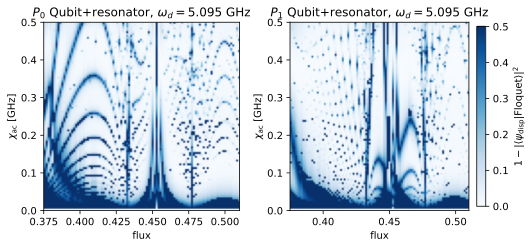

In [22]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize=(7.6, 3.6))
im1 = ax1.imshow(
    np.ma.masked_invalid(scar_single_0).T,
    origin="lower", cmap="Blues", aspect="auto",
    extent=[flux_vals.min(), flux_vals.max(),
            chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)],
    vmin=0.0, vmax=0.5,
)
ax1.set_xlabel("flux")
ax1.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
ax1.set_title(f"$P_{0}$ Qubit+resonator, $\omega_d = 5.095$ GHz")

im2 = ax2.imshow(
    np.ma.masked_invalid(scar_single_1).T,
    origin="lower", cmap="Blues", aspect="auto",
    extent=[flux_vals.min(), flux_vals.max(),
            chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)],
    vmin=0.0, vmax=0.5,
)
ax2.set_xlabel("flux")
ax2.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
ax2.set_title(f"$P_{1}$ Qubit+resonator, $\omega_d = 5.095$ GHz")

cbar = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
cbar.set_label(r"$1 - |\langle \psi_{\mathrm{disp}}|\mathrm{Floquet}\rangle|^2$")
plt.tight_layout()
plt.show()



1. check with branch analysis
2. change driving operator to the qubit charge operator
3. add qubit-induced nonlinearities to resonator frequency (Boissonnealt 2010)

## Composite System (qA) - Driving on Qubit Mode

In [ ]:
num_states = 15
qubit_params = {
    'EJ': 4.167,
    'EC': 0.8308,
    'EL': 1.203,
    'flux': 0.5,
    'cutoff': 110,
}

fluxonium = scq.Fluxonium(**qubit_params, truncated_dim=num_states)

N_osc    = 10            
omega_osc = 5.098 * 2*np.pi   
kappa_res = 2*np.pi * 0.005   
g         = 0.026 * 2*np.pi   

omega_d_fix  = 5.095 * 2*np.pi
omega_d_band = 2*np.pi * np.linspace(5.095 - 5e-3, 5.095 + 5e-3, 5) 

flux_vals    = np.linspace(0.375, 0.51, 40)
chi_ac_vals  = 2*np.pi * np.linspace(0, 0.5, 40) #n_max = 500Mhz/chi ==> 250-300 photon??

options = ft.Options(
    fit_range_fraction=0.6,
    fit_cutoff=3,
    overlap_cutoff=0.4,
    nsteps=10_000,
    num_cpus=3,
)

#Modified for drive on QUBIT OPERATOR

def run_floquet_composite(flx_val: float, omega_d_vals: np.ndarray) -> dict:
    qparams = {**qubit_params, 'flux': float(flx_val)}

    q = scq.Fluxonium(**qparams, truncated_dim=num_states)
    hs = scq.HilbertSpace([q]); hs.generate_lookup()

    evals_q, evecs = q.eigensys(evals_count=num_states)
    H0_flux = 2*np.pi * qt.Qobj(np.diag(evals_q - evals_q[0]), dims=[[num_states],[num_states]])

    n_op = q.phi_operator()
    n_arr = n_op.toarray() if hasattr(n_op, 'toarray') else np.asarray(n_op)
    cutoff = n_arr.shape[0]

    if isinstance(evecs, np.ndarray):
        if evecs.shape == (cutoff, num_states):
            Uq = evecs
        elif evecs.shape == (num_states, cutoff):
            Uq = evecs.T
        else:
            Uq = np.column_stack([vec for vec in evecs]).reshape((cutoff, num_states))
    else:
        Uq = np.column_stack([np.asarray(vec).reshape(-1) for vec in evecs])

    n_proj = Uq.conj().T @ n_arr @ Uq
    H1_flux = qt.Qobj(n_op)
    a  = qt.destroy(N_osc)
    Iq = qt.qeye(num_states)
    Ir = qt.qeye(N_osc)
    H_flux = qt.tensor(H0_flux, Ir)
    H_osc  = omega_osc * qt.tensor(Iq, a.dag()*a)
    H_int  = g * qt.tensor(H1_flux, (a + a.dag()))
    H_static = H_flux + H_osc + H_int
    # *** DRIVE ON QUBIT ***!!
    H1_drive = qt.tensor(H1_flux, qt.qeye(N_osc))
    placeholder = np.zeros((len(chi_ac_vals), len(omega_d_vals)))
    model = ft.model.CompositeModel(
        H0_bare=H_static,
        H1_drive=H1_drive,
        omega_d_values=omega_d_vals,
        drive_amplitudes=placeholder,
        subsystem_dims=[num_states, N_osc],
        state_labels_dims=(num_states, N_osc),
    )

    dressed_indices = model.labels_to_indices([(0, 0), (1, 0)])

    chi2amp = ft.ChiacToAmp(model.H0, model.H1, dressed_indices, model.omega_d_values)
    model.drive_amplitudes = chi2amp.amplitudes_for_omega_d(chi_ac_vals)
    #(len(chi_ac_vals), len(omega_d_vals))

    fa = ft.FloquetAnalysis(model, state_indices=dressed_indices, options=options)
    return fa.run(filepath=None)

def plot_map(arrays, title):
    fig, ax = plt.subplots(figsize=(7.8, 3.6))
    im = ax.imshow(
        arrays.T, origin="lower", cmap="OrRd", aspect="auto",
        extent=[flux_vals.min(), flux_vals.max(),
                chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)]
    )
    ax.set_xlabel("flux")
    ax.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"$1 - |\langle\mathrm{disp}|\mathrm{Floquet}\rangle|^2$")
    plt.tight_layout(); plt.show()

In [13]:
num_states = 10
qubit_params = {
    'EJ': 4.167,
    'EC': 0.8308,
    'EL': 1.203,
    'flux': 0.5,
    'cutoff': 110,
}

fluxonium = scq.Fluxonium(**qubit_params, truncated_dim=num_states)

N_osc    = 10              
omega_osc = 5.098 * 2*np.pi   
kappa_res = 2*np.pi * 0.005   
g         = 0.026 * 2*np.pi   

omega_d_fix  = 5.095 * 2*np.pi
omega_d_band = 2*np.pi * np.linspace(5.095 - 5e-3, 5.095 + 5e-3, 5) 

flux_vals    = np.linspace(0.35, 0.51, 100)
chi_ac_vals  = 2*np.pi * np.linspace(0, 0.5, 100) #n_max = 500Mhz/chi ==> 250-300 photon??

options = ft.Options(
    fit_range_fraction=0.6,
    fit_cutoff=3,
    overlap_cutoff=0.4,
    nsteps=30_000,
    num_cpus=3,
)
def _columns_from_evecs(evecs, cutoff, num_states):

    #we need to pick an orientation such that U^dagU = I
    # so we can build a matrix of shape (cutoff times num states (dim of qubit subspace)) with eigenvectors as columns
    if isinstance(evecs, (list, tuple)):
        M = np.column_stack([np.asarray(v).reshape(-1) for v in evecs])
    else:
        Mraw = np.asarray(evecs)
        cands = []
        for C in (Mraw, Mraw.T):
            if C.shape == (cutoff, num_states):
                err = np.linalg.norm(C.conj().T @ C - np.eye(num_states))
                cands.append((err, C))
        if not cands:
            raise ValueError("not a compatible shape ==> cannot form (cutoff,num_states).")
        _, M = min(cands, key=lambda x: x[0])

    assert np.linalg.norm(M.conj().T @ M - np.eye(num_states)) < 1e-8, "U not unitary in subspace"
    return M

def run_floquet_composite(flx_val: float, omega_d_vals: np.ndarray) -> dict:
    qparams = {**qubit_params, 'flux': float(flx_val)}
    q = scq.Fluxonium(**qparams, truncated_dim=num_states)
    hs = scq.HilbertSpace([q]); hs.generate_lookup()

    evals_q, evecs = q.eigensys(evals_count=num_states)
    H0_flux = 2*np.pi * qt.Qobj(np.diag(evals_q - evals_q[0]), dims=[[num_states],[num_states]])

    n_op = q.phi_operator() #CHANGE DRIVE OPERATOR HERE 
    n_arr = np.array(n_op)  
    cutoff = n_arr.shape[0]
    Uq = _columns_from_evecs(evecs, cutoff, num_states)
    n_proj = Uq.conj().T @ n_arr @ Uq

    H1_flux = qt.Qobj(n_proj, dims=[[num_states],[num_states]])
    H1_flux = 0.5 * (H1_flux + H1_flux.dag())

    a  = qt.destroy(N_osc)
    Iq = qt.qeye(num_states)
    Ir = qt.qeye(N_osc)

    H_flux   = qt.tensor(H0_flux, Ir)
    H_osc    = omega_osc * qt.tensor(Iq, a.dag()*a)
    H_int    = g * qt.tensor(H1_flux, (a + a.dag()))
    H_static = H_flux + H_osc + H_int

    # --- DRIVE ON THE QUBIT operator!!
    H1_drive = qt.tensor(H1_flux, Ir)

    assert H_static.dims == H1_drive.dims == [[num_states, N_osc],[num_states, N_osc]] #just to make sure dimension alignment 
    placeholder = np.zeros((len(chi_ac_vals), len(omega_d_vals)))
    model = ft.model.CompositeModel(
        H0_bare=H_static,
        H1_drive=H1_drive,
        omega_d_values=omega_d_vals,
        drive_amplitudes=placeholder,
        subsystem_dims=[num_states, N_osc],
        state_labels_dims=(num_states, N_osc),
    )

    dressed_indices = model.labels_to_indices([(0, 0), (1, 0)])

    chi2amp = ft.ChiacToAmp(model.H0, model.H1, dressed_indices, model.omega_d_values)
    model.drive_amplitudes = chi2amp.amplitudes_for_omega_d(chi_ac_vals)

    # == double checking that H1 is not just zeroing outthrough wrong projection ==

    fa = ft.FloquetAnalysis(model, state_indices=dressed_indices, options=options)
    return fa.run(filepath=None), model.H1


In [14]:
scar_single_0 = np.zeros((len(flux_vals), len(chi_ac_vals)))
scar_single_1 = np.zeros((len(flux_vals), len(chi_ac_vals)))

for i, flx in enumerate(flux_vals):
    print(f'Sweep for flux point = {flx}')
    print(f'For state idx: {i}')
    data = run_floquet_composite(flx, np.array([omega_d_fix]))[0]
    ovlp_0 = data["displaced_state_overlaps"][:, :, 0]
    ovlp_1 = data["displaced_state_overlaps"][:, :, 1]
    scar_single_0[i, :] = np.clip(1 - np.abs(ovlp_0[0, :])**2, 0, 0.5)
    scar_single_1[i, :] = np.clip(1 - np.abs(ovlp_1[0, :])**2, 0, 0.5)

Sweep for flux point = 0.35
For state idx: 0
Running floquet simulation with parameters: 
model: H0_bare: Quantum object: dims=[[10, 10], [10, 10]], shape=(100, 100), type='oper', dtype=Dia, isherm=True
Qobj data =
[[ 0.00000000e+00 -2.45695958e-01  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-2.45695958e-01  3.20316787e+01 -3.47466556e-01 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -3.47466556e-01  6.40633574e+01 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  3.93412634e+02
  -3.52780688e-01  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ... -3.52780688e-01
   4.25444313e+02 -3.74180425e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
  -3.74180425e-01  4.57475991e+02]]
H1_drive: Quantum object: dims=[[10, 10], [10, 10]], shape=(100, 100), type='oper', dtype=Dia, isherm=True
Qobj data =
[[-1.50398947  0.          0. 

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(7.6, 3.6))
im1 = ax1.imshow(
    np.ma.masked_invalid(scar_single_0).T,
    origin="lower", cmap="Blues", aspect="auto",
    extent=[flux_vals.min(), flux_vals.max(),
            chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)],
    vmin=0.0, vmax=0.5,
)
ax1.set_xlabel("flux"); ax1.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
ax1.set_title(r"$P_{0}$ (drive on qubit), $\omega_d = 5.095$ GHz")

im2 = ax2.imshow(
    np.ma.masked_invalid(scar_single_1).T,
    origin="lower", cmap="Blues", aspect="auto",
    extent=[flux_vals.min(), flux_vals.max(),
            chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)],
    vmin=0.0, vmax=0.5,
)
ax2.set_xlabel("flux"); ax2.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
ax2.set_title(r"$P_{1}$ (drive on qubit), $\omega_d = 5.095$ GHz")

cbar = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
cbar.set_label(r"$1 - |\langle \psi_{\mathrm{disp}}|\mathrm{Floquet}\rangle|^2$")
plt.tight_layout()
plt.show()
 

In [ ]:
num_states = 20
qubit_params = {
    'EJ': 4.167,
    'EC': 0.8308,
    'EL': 1.203,
    'flux': 0.5,
    'cutoff': 110,
}

fluxonium = scq.Fluxonium(**qubit_params, truncated_dim=num_states)

N_osc    = 10              
omega_osc = 5.098 * 2*np.pi   
kappa_res = 2*np.pi * 0.005   
g         = 0.026 * 2*np.pi   

omega_d_fix  = 5.095 * 2*np.pi
omega_d_band = 2*np.pi * np.linspace(5.095 - 5e-3, 5.095 + 5e-3, 5) 

flux_vals    = np.linspace(0.35, 0.51, 71)
chi_ac_vals  = 2*np.pi * np.linspace(0, 0.5, 71) #n_max = 500Mhz/chi ==> 250-300 photon??

options = ft.Options(
    fit_range_fraction=0.6,
    fit_cutoff=4,
    overlap_cutoff=0.7,
    nsteps=10_000,
    num_cpus=3,
    save_floquet_modes=True,
)


def run_floquet_composite_charge(flx_val: float, omega_d_vals: np.ndarray) -> dict:
    qparams = {**qubit_params, 'flux': float(flx_val)}
    q = scq.Fluxonium(**qparams, truncated_dim=num_states)
    hs = scq.HilbertSpace([q]); hs.generate_lookup()

    evals_q, evecs = q.eigensys(evals_count=num_states)
    H0_flux = 2*np.pi * qt.Qobj(np.diag(evals_q - evals_q[0]), dims=[[num_states],[num_states]])

    n_op = q.n_operator() #CHANGE DRIVE OPERATOR HERE 
    n_arr = np.array(n_op)  
    cutoff = n_arr.shape[0]
    Uq = _columns_from_evecs(evecs, cutoff, num_states)
    n_proj = Uq.conj().T @ n_arr @ Uq

    H1_flux = qt.Qobj(n_proj, dims=[[num_states],[num_states]])
    H1_flux = 0.5 * (H1_flux + H1_flux.dag())

    a  = qt.destroy(N_osc)
    Iq = qt.qeye(num_states)
    Ir = qt.qeye(N_osc)

    H_flux   = qt.tensor(H0_flux, Ir)
    H_osc    = omega_osc * qt.tensor(Iq, a.dag()*a)
    H_int    = g * qt.tensor(H1_flux, (a + a.dag()))
    H_static = H_flux + H_osc + H_int

    # --- DRIVE ON THE QUBIT operator!!
    H1_drive = qt.tensor(H1_flux, Ir)

    assert H_static.dims == H1_drive.dims == [[num_states, N_osc],[num_states, N_osc]] #just to make sure dimension alignment 
    placeholder = np.zeros((len(chi_ac_vals), len(omega_d_vals)))
    model = ft.model.CompositeModel(
        H0_bare=H_static,
        H1_drive=H1_drive,
        omega_d_values=omega_d_vals,
        drive_amplitudes=placeholder,
        subsystem_dims=[num_states, N_osc],
        state_labels_dims=(num_states, N_osc),
    )

    dressed_indices = model.labels_to_indices([(0, 0), (1, 0)])

    chi2amp = ft.ChiacToAmp(model.H0, model.H1, dressed_indices, model.omega_d_values)
    model.drive_amplitudes = chi2amp.amplitudes_for_omega_d(chi_ac_vals)

    # == double checking that H1 is not just zeroing outthrough wrong projection ==

    fa = ft.FloquetAnalysis(model, state_indices=dressed_indices, options=options)
    return fa.run(filepath=None), model.H1


In [26]:
scar_single_0_n = np.zeros((len(flux_vals), len(chi_ac_vals)))
scar_single_1_n = np.zeros((len(flux_vals), len(chi_ac_vals)))

for i, flx in enumerate(flux_vals):
    print(f'Sweep for flux point = {flx}')
    print(f'For state idx: {i}')
    data_n = run_floquet_composite_charge(flx, np.array([omega_d_fix]))[0]
    ovlp_0_n = data_n["displaced_state_overlaps"][:, :, 0]
    ovlp_1_n = data_n["displaced_state_overlaps"][:, :, 1]
    scar_single_0_n[i, :] = np.clip(1 - np.abs(ovlp_0_n[0, :])**2, 0, 0.5)
    scar_single_1_n[i, :] = np.clip(1 - np.abs(ovlp_1_n[0, :])**2, 0, 0.5)

Sweep for flux point = 0.35
For state idx: 0
Running floquet simulation with parameters: 
model: H0_bare: Quantum object: dims=[[10, 10], [10, 10]], shape=(100, 100), type='oper', dtype=Dia, isherm=True
Qobj data =
[[  0.        +0.j   0.        +0.j   0.        +0.j ...   0.        +0.j
    0.        +0.j   0.        +0.j]
 [  0.        +0.j  32.0316787 +0.j   0.        +0.j ...   0.        +0.j
    0.        +0.j   0.        +0.j]
 [  0.        +0.j   0.        +0.j  64.06335739+0.j ...   0.        +0.j
    0.        +0.j   0.        +0.j]
 ...
 [  0.        +0.j   0.        +0.j   0.        +0.j ... 393.41263382+0.j
    0.        +0.j   0.        +0.j]
 [  0.        +0.j   0.        +0.j   0.        +0.j ...   0.        +0.j
  425.44431252+0.j   0.        +0.j]
 [  0.        +0.j   0.        +0.j   0.        +0.j ...   0.        +0.j
    0.        +0.j 457.47599121+0.j]]
H1_drive: Quantum object: dims=[[10, 10], [10, 10]], shape=(100, 100), type='oper', dtype=Dia, isherm=True
Qobj d

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(7.6, 3.6))
im1 = ax1.imshow(
    np.ma.masked_invalid(scar_single_0_n).T,
    origin="lower", cmap="Blues", aspect="auto",
    extent=[flux_vals.min(), flux_vals.max(),
            chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)],
    vmin=0.0, vmax=0.5,
)
ax1.set_xlabel("flux"); ax1.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
ax1.set_title(r"$P_{0}$ (drive on qubit), $\omega_d = 5.095$ GHz")

im2 = ax2.imshow(
    np.ma.masked_invalid(scar_single_1_n).T,
    origin="lower", cmap="Blues", aspect="auto",
    extent=[flux_vals.min(), flux_vals.max(),
            chi_ac_vals.min()/(2*np.pi), chi_ac_vals.max()/(2*np.pi)],
    vmin=0.0, vmax=0.5,
)
ax2.set_xlabel("flux"); ax2.set_ylabel(r"$\chi_{\rm ac}$ [GHz]")
ax2.set_title(r"$P_{1}$ (drive on qubit), $\omega_d = 5.095$ GHz")

cbar = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
cbar.set_label(r"$1 - |\langle \psi_{\mathrm{disp}}|\mathrm{Floquet}\rangle|^2$")
plt.tight_layout()
plt.show()

To Do:
1. Scratch the resonator mode. Sweep just qubit mode.
    - do flux sweep
    - do frequency sweep
    - perform branch analysis based on the results
2. Branch analysis at target flux point -- composite system results
3. Compare branch analysis results to Sherbrooke
4. Switch to another qubit (qC) -- do drive sweep, branch analysis, flux sweep
5. vary the qubit params of qA (error margins)
6. Quantitative answer to the dimensionality problem (how much are we populating qubit and resonator subsystems)
7. add qubit-induced nonlinearities to resonator frequency (Boissonnealt 2010)

Higher order problems:
- adding single mode leakage channels incrementally + compare to data!
- adapt to open quantum systems (Floquet with Linblad)